In [1]:
#the libraries needed to run the Notebook

from itertools import chain
import pandas as pd
from functions import extract_top_movies_per_user
from functions import minhash_signature
from functions import our_hash_function
from functions import lsh
from functions import jaccard_similarity
from functions import find_nearest_neighbors
from functions import recommend_movies


# **1. Recommendation system** 


The exercise asks to gather the top 10 movies clicked by each user, therefore I implemented a function named "extract_top_movies_per_user". This function takes in input the path of the dataset and returns a new dataset with the following details for each user:

- *user_id:* The unique identifier of the user
- *title:* The title of the movie
- *genres:* The genres of the movie
- *click_count:* The number of times the user clicked on the movie

The function uses pandas to read the dataset, groups the data by user_id, title, and genres, calculates the click count for each movie, and then selects the top 10 movies with the highest click counts for each user. The resulting dataset is sorted by user_id and click_count.


In [2]:
top_movies_per_user = extract_top_movies_per_user('vodclickstream_uk_movies_03.csv')

# Printing only the first 10 rows to provide an overview of the dataset
top_movies_per_user.head(10)

,user_id,title,genres,click_count
0,00004e2862,Hannibal,"Crime, Drama, Thriller",1
6,000052a0a0,Looper,"Action, Drama, Sci-Fi, Thriller",9
3,000052a0a0,Frailty,"Crime, Drama, Thriller",3
5,000052a0a0,Jumanji,"Adventure, Comedy, Family, Fantasy",3
7,000052a0a0,Resident Evil,"Action, Horror, Sci-Fi",2
1,000052a0a0,Ant-Man,"Action, Adventure, Comedy, Sci-Fi",1
2,000052a0a0,Drive Angry,"Action, Fantasy, Thriller",1
4,000052a0a0,Green Room,"Horror, Music, Thriller",1
8,000052a0a0,Resident Evil: Retribution,"Action, Horror, Sci-Fi, Thriller",1
9,000052a0a0,The Big Lebowski,"Comedy, Crime, Sport",1


## **1.2 Minhash Signatures**

To calculate the MinHash signature, we started the process by building a *shingle matrix* for each user. This matrix was built by enumerating all possible genres, assigning unique integers to them, and creating a list for each user. In this list, each position was set to 1 if the genre at that position in the list of all possible genres was present in the user's list of preferred genres; otherwise, the position was set to zero.

After building the shingle matrix, we proceeded to calculate the MinHash signature using the minhash_signature function. This function returns a list representing the MinHash signature for the given user based on their preferred genres. The input parameters for this function include:
- *user_genres:* List of preferred genres for the user
- *num_hashes:* Number of hash functions to use
- *genre_dict:* Dictionary mapping genres to unique integers
- *num_total_genres:* Total number of unique genres in the dataset

To calculate the hash function it was not used any already implemented function, as requested. We chose 100 for the number of hashes since it is generally considered a good amount of hashes for Minhashing.

In [3]:
# Dictionary that keeps track of each users' preferred genres
user_genres_dict = top_movies_per_user.groupby('user_id')['genres'].apply(list).to_dict()

# Making a list of all unique genres in the dataset and assigning a unique integer to each genre to build the shingle matrix in the minhash function for each user
all_genres = sorted(list(set(chain.from_iterable([genre.split(', ') if isinstance(genre, str) else genre for genre in top_movies_per_user['genres']]))))
genre_dict = {genre: i for i, genre in enumerate(all_genres)}
num_total_genres = len(all_genres)
    
# Using the defined function to calculate the MinHash signatures for all users
num_hashes = 100
minhash_signatures = {user_id: minhash_signature(genres, num_hashes, genre_dict, num_total_genres) for user_id, genres in user_genres_dict.items()}


## **1.3 Locality-Sensitive Hashing (LSH)**

Now that we have a dictionary containing the signatures for each user, we can utilize the Locality-Sensitive Hashing (LSH) algorithm to identify users with similar interests. In this algorithm, users with similar signatures are grouped into the same bucket. This approach helps in reducing the number of users for which we need to calculate the Jaccard similarity.

To find the two users most similar users to the input user, we calculate the Jaccard Similarity for all users in the bucket where the input user is present. We then select the two users with the highest similarity scores. This process is done through the 'find_nearest_neighbors' function, which first executes the LSH algorithm to organize users into buckets based on their MinHash signatures and then calculates the similarity scores to find the **two most similar users**. The function takes the following inputs:
- target_user: The user for which we want to find the most similar users
- minhash_signatures: The dictionary containing the MinHash signatures for each user
- bands: The number of bands used in the LSH algorithm
- rows_per_band: The number of rows per band in the LSH algorithm

We selected an adequate number of bands and rows to make sure that the similarity measure between users is not too restrictive.

In [34]:
# Target user is the user which we want to recommend movies to
target_user = '9966728c1c'
bands = 6
rows_per_band = 10
    
most_similar_users = find_nearest_neighbors(target_user, minhash_signatures, bands, rows_per_band)

print(f"The two most similar users to {target_user} are: {most_similar_users}")


The two most similar users to 9966728c1c are: ['004f54b636', '00ca88823f']


Now that we have identified the two most similar neighbors, we can proceed to recommend movies as specified by the exercise, choosing first the movies that these two users have in common, in order based on the number of clicks, and then if there are no more common movies, choosing the most clicked movies by the most similar user first, followed by the other user.
We proceeded to recommend movies using the "recommend_movies" function, which takes as input:
- *most_similar_users:* list containing the two most similar users
- *top_movies_per_user:* DataFrame containing information about the top movies per user

 And returns the list of recommended movies, in order.

In [35]:
recommended_movies = recommend_movies(most_similar_users, top_movies_per_user)

print(f"Recommended movies for user \"{target_user}\":")
for movie in recommended_movies:
    print(movie)

{'004f54b636': {'The Martian', 'Bright', "Daddy's Home", 'Ip Man 3'}, '00ca88823f': {'Ip Man 2', 'The Great Gatsby', '21 Jump Street', 'Ip Man', 'Ip Man 3'}}
Recommended movies for user "9966728c1c":
Ip Man 3
Bright
Daddy's Home
The Martian
The Great Gatsby


As we can see from the above example, if there are common movies between the two most similar users , the algorithm chooses them first based on the number of clicks, and then, if the number of recommendations is not enough, it chooses the moviest from the most similar user first and then from the second most similar user.

In [33]:
target_user = '1ec083a8bd'

most_similar_users = find_nearest_neighbors(target_user, minhash_signatures, bands, rows_per_band)
print(f"The two most similar users to {target_user} are: {most_similar_users}")

recommended_movies = recommend_movies(most_similar_users, top_movies_per_user)

print(f"Recommended movies for user \"{target_user}\":")
for movie in recommended_movies:
    print(movie)

{'058fae3544': {"Child's Play", 'Before I Wake'}, '06d8685ddb': {'IBOY', 'Cold Skin', 'Hardcore'}}
Recommended movies for user "1ec083a8bd":
Child's Play
Before I Wake
Cold Skin
Hardcore
IBOY


And as we can see from the second example, if there no common movies, the algorithm chooses the movies directly in order of number of clicks first from the most similar user and then from the second most similar user.

## 2. Grouping Users together!

### 2.1 Getting your data + feature engineering
Sometimes, the features (variables, fields) are not given in a dataset but can be created from it; this is known as feature engineering. For example, the original dataset has several clicks done by the same user, so grouping data by user_id will allow you to create new features for each user:

a) Favorite genre (i.e., the genre on which the user spent the most time)

b) Average click duration

c) Time of the day (Morning/Afternoon/Night) when the user spends the most time on the platform (the time spent is tracked through the duration of the clicks)

d) Is the user an old movie lover, or is he into more recent stuff (content released after 2010)?

e) Average time spent a day by the user (considering only the days he logs in)

Consider at least 10 additional features that can be generated for each user_id (you can use chatGPT or other LLM tools for suggesting features to create). Describe each of them and add them to the previous dataset you made (the one with five features). In the end, you should have for each user at least 15 features (5 recommended + 10 suggested by you).

In [1]:
import pandas as pd
import ast
import plotly.express as px
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from collections import defaultdict

In [2]:
df=pd.read_csv('vodclickstream_uk_movies_03.csv', parse_dates=['datetime','release_date'])

In [3]:
del df['Unnamed: 0']

In [4]:
df['release_date'] = pd.to_datetime(df['release_date'], errors='coerce')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 671736 entries, 0 to 671735
Data columns (total 7 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   datetime      671736 non-null  datetime64[ns]
 1   duration      671736 non-null  float64       
 2   title         671736 non-null  object        
 3   genres        671736 non-null  object        
 4   release_date  641432 non-null  datetime64[ns]
 5   movie_id      671736 non-null  object        
 6   user_id       671736 non-null  object        
dtypes: datetime64[ns](2), float64(1), object(4)
memory usage: 35.9+ MB


In [6]:
df.head()

,datetime,duration,title,genres,release_date,movie_id,user_id
0,2017-01-01 01:15:09,0.0,"Angus, Thongs and Perfect Snogging","Comedy, Drama, Romance",2008-07-25,26bd5987e8,1dea19f6fe
1,2017-01-01 13:56:02,0.0,The Curse of Sleeping Beauty,"Fantasy, Horror, Mystery, Thriller",2016-06-02,f26ed2675e,544dcbc510
2,2017-01-01 15:17:47,10530.0,London Has Fallen,"Action, Thriller",2016-03-04,f77e500e7a,7cbcc791bf
3,2017-01-01 16:04:13,49.0,Vendetta,"Action, Drama",2015-06-12,c74aec7673,ebf43c36b6
4,2017-01-01 19:16:37,0.0,The SpongeBob SquarePants Movie,"Animation, Action, Adventure, Comedy, Family, ...",2004-11-19,a80d6fc2aa,a57c992287


In [7]:
df=df.dropna()

Features suggested by the Question:

In [10]:
# a) Favorite genre for each user
favorite_genre = df.groupby('user_id')['genres'].agg(lambda x: x.str.split(',').explode().mode().iloc[0])

In [11]:
# b) Average click duration for each user
average_click_duration = df.groupby('user_id')['duration'].mean()

In [12]:
# c) Time of the day when the user spends the most time
df['hour_of_day'] = df['datetime'].dt.hour
time_of_day_mode = df.groupby('user_id')['hour_of_day'].agg(lambda x: x.mode().iloc[0])

In [13]:
# Map time of day to categories (Morning, Afternoon, Night)
time_of_day_mapping = {range(6, 12): 'Morning', range(12, 18): 'Afternoon', range(18, 24): 'Night'}
time_of_day = time_of_day_mode.apply(lambda x: next((v for k, v in time_of_day_mapping.items() if x in k), None))

In [14]:
# d) Determine if the user is into old or recent movies
df['old_movie_lover'] = df['release_date'].dt.year < 2010

In [15]:
old_movie_lover = df.groupby('user_id')['old_movie_lover'].any().reset_index(name='old_movie_lover')

In [16]:
# e) Average time spent per day for each user
df['date'] = df['datetime'].dt.date
average_time_per_day = df.groupby(['user_id', 'date'])['duration'].sum().groupby('user_id').mean()

Features engineered with the help of ChatGPT:

In [17]:
#The number of unique genres the user has interacted with.
genre_diversity = df.groupby('user_id')['genres'].agg(lambda x: len(set(x.str.split(',').explode())))
df['day_of_week'] = df['datetime'].dt.day_name()
most_active_day = df.groupby('user_id')['day_of_week'].agg(lambda x: x.mode().iloc[0])
session_threshold = 30 * 60  # Assuming a session lasts for 30 minutes
df['session_id'] = (df['datetime'] - df['datetime'].shift(1) > pd.Timedelta(session_threshold, 's')).cumsum()
avg_clicks_per_session = df.groupby('user_id')['session_id'].value_counts().groupby('user_id').mean()
favorite_release_year = df.groupby('user_id')['release_date'].agg(lambda x: x.dt.year.mode().tolist())
prime_time_clicks = df[(df['hour_of_day'] >= 18) & (df['hour_of_day'] < 24)].groupby('user_id')['user_id'].count() / df.groupby('user_id')['user_id'].count()
df['is_weekend'] = df['datetime'].dt.weekday // 5
weekend_preference = df.groupby('user_id')['is_weekend'].mean()
session_durations = df.groupby(['user_id', 'session_id'])['duration'].sum()
longest_session_duration = session_durations.groupby('user_id').max()
recent_movies_clicks = df[df['release_date'] >= df['release_date'].max() - pd.DateOffset(years=1)].groupby('user_id')['user_id'].count() / df.groupby('user_id')['user_id'].count()
recent_movies_duration = df[df['release_date'] >= df['release_date'].max() - pd.DateOffset(months=1)].groupby('user_id')['duration'].mean()

In [18]:
# Calculate the count of each genre for each user
genre_counts = df.groupby(['user_id', 'genres'])['user_id'].count().reset_index(name='genre_count')

# Find the genre with the maximum count for each user
dominant_genre = genre_counts.groupby('user_id').apply(lambda x: x.loc[x['genre_count'].idxmax()]['genres'])

# Map the dominant genre to a numerical score
genre_mapping = {genre: score for score, genre in enumerate(dominant_genre.unique())}
genre_preference_score = dominant_genre.map(genre_mapping)

In [19]:
feature_view=pd.DataFrame({
    'favorite_genre': favorite_genre,
    'average_click_duration': average_click_duration,
    'time_of_day': time_of_day,
    'average_time_per_day': average_time_per_day,
    'genre_diversity': genre_diversity,
    'most_active_day': most_active_day,
    'avg_clicks_per_session':avg_clicks_per_session,
    'favorite_release_year':favorite_release_year,
    'prime_time_clicks': prime_time_clicks,
    'weekend_preference':weekend_preference,
    'longest_session_duration':longest_session_duration,
    'recent_movies_clicks':recent_movies_clicks,
    'genre_preference_score':genre_preference_score,
    'avg_duration_recent_interactions':recent_movies_duration
    }).reset_index()

In [20]:
feature_view = feature_view.merge(old_movie_lover, how='left', on='user_id')

In [21]:
feature_view

,user_id,favorite_genre,average_click_duration,time_of_day,average_time_per_day,genre_diversity,most_active_day,avg_clicks_per_session,favorite_release_year,prime_time_clicks,weekend_preference,longest_session_duration,recent_movies_clicks,genre_preference_score,avg_duration_recent_interactions,old_movie_lover
0,00004e2862,Drama,0.000000,Night,0.000,3,Tuesday,1.0,[2001],1.000000,0.000000,0.0,NaN,0,NaN,True
1,000052a0a0,Thriller,2024.166667,Night,4858.000,19,Sunday,1.0,[2012],0.750000,0.458333,7857.0,NaN,1,NaN,True
2,000090e7c8,Sci-Fi,0.000000,Night,0.000,3,Friday,1.0,[2018],1.000000,0.000000,0.0,NaN,2,NaN,False
3,000118a755,Horror,0.000000,Night,0.000,1,Thursday,1.0,[1976],1.000000,0.000000,0.0,NaN,3,NaN,True
4,000296842d,Mystery,9663.375000,Night,38653.500,4,Monday,1.0,[2018],0.625000,0.250000,62860.0,NaN,4,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157910,fffd9bf758,Crime,8495.000000,Night,8495.000,3,Wednesday,1.0,[2015],1.000000,0.000000,8495.0,NaN,597,NaN,False
157911,fffe7b777b,Sci-Fi,1785.000000,Afternoon,1785.000,3,Saturday,1.0,[2017],NaN,1.000000,1785.0,NaN,140,NaN,False
157912,fffeac83be,Documentary,40606.272727,Night,55833.625,12,Wednesday,1.0,[2015],0.909091,0.090909,173436.0,NaN,55,NaN,True
157913,ffff2c5f9e,Comedy,0.000000,Afternoon,0.000,5,Sunday,1.0,"[2007, 2013]",NaN,1.000000,0.0,NaN,212,NaN,True


In [22]:
feature_view.to_csv('feature_engineered.csv')

### 2.2 Choose your features (variables)!
You may notice that you have plenty of features to work with now. So, it would be best to find a way to reduce the dimensionality (reduce the number of variables to work with). You can follow the subsequent directions to achieve it:

**To normalise or not to normalise? That's the question.** Sometimes, it is worth normalizing (scaling) the features. Explain if it is a good idea to perform any normalization method. If you think the normalization should be used, apply it to your data (look at the available normalization functions in the scikit-learn library).

Select one **method for dimensionality reduction** and apply it to your data. Some suggestions are Principal Component Analysis, Multiple Correspondence Analysis, Singular Value Decomposition, Factor Analysis for Mixed Data, Two-Steps clustering. Make sure that the method you choose applies to the features you have or modify your data to be able to use it. Explain why you chose that method and the limitations it may have.

To address this question, we first answer, when do we normalise?

Algorithms like k-nearest neighbors, support vector machines, and neural networks can be sensitive to the scale of features. Normalizing ensures that no single feature dominates the learning process.

Distance-Based Metrics:

If the algorithms involve distance calculations (e.g., clustering or k-nearest neighbors), normalization is often necessary to ensure that all features contribute equally.

Let's load our feature engineered dataset first and see how it is:

In [25]:
dataset=pd.read_csv('feature_engineered.csv', index_col=0)

In [26]:
dataset.loc[5,'favorite_release_year']

'[2011, 2012, 2016]'

It appears that, in the dataset, the favorite_release_year feature has more than one year values in some of the cases, favorite_release_year was calculated on the basis of mode of the years, and sometimes multiple years got the same mode. To deal with this, I wilkl take a bias of only to consider the first year value as the favorite release year. First am converting these to list to access easily, then am counting how many such cases are there and finally, I am applying the transformation to consider just one value for the favourite release year.

In [27]:
#Converting favorite release year string representations to lists
dataset['favorite_release_year'] = dataset['favorite_release_year'].apply(ast.literal_eval)

In [28]:
#getting the count of cases where favourite release year is multiple.
dataset['favorite_release_year'].apply(lambda x: len(x) if isinstance(x, list) else 0).gt(1).sum()

35974

In [29]:
#applying the transformation to include single value
dataset['favorite_release_year']=dataset['favorite_release_year'].apply(lambda x: x[0]) 

In [30]:
dataset.loc[5,'favorite_release_year'] #checking now there is only a single value for each of the favorite release years.

2011

Let's use the MinMaxScaler from scikit-learn to scale the features between 0 and 1. We will exclude categorical features like 'favorite_genre' and 'time_of_day' from normalization, as these features are not continuous numerical values.

In [31]:
#we just consider the continuous numerical features for scaling:
numerical_features = dataset.select_dtypes(['float64','int64']).columns

In [ ]:
# We Create a MinMaxScaler instance
scaler = MinMaxScaler()

# We Fit the scaler on the selected columns and transform them
dataset[numerical_features] = scaler.fit_transform(dataset[numerical_features])

In [33]:
#here we check the presence of missing values in the features
dataset.isnull().sum()

user_id                                  0
favorite_genre                           0
average_click_duration                   0
time_of_day                          20851
average_time_per_day                     0
genre_diversity                          0
most_active_day                          0
avg_clicks_per_session                   0
favorite_release_year                    0
prime_time_clicks                    45608
weekend_preference                       0
longest_session_duration                 0
recent_movies_clicks                157550
genre_preference_score                   0
avg_duration_recent_interactions    157878
old_movie_lover                          0
dtype: int64

Now we will impute the dataset:
Imputing is a procedure where missing values in a feature are replaced with typical values within the dataset. By typical, we want it to be as indistinguishable from other values of that feature as possible. 

In [34]:
#making a copy to proceed further
dataset_imputed= dataset.copy()

In [35]:
#in our approach, we are filling this feature with its Modal value, i.e the most appeared value as it is a categorical variable
dataset_imputed['time_of_day'] = dataset['time_of_day'].fillna(dataset['time_of_day'].mode()[0])

In [36]:
#we are imputing the missing continuous numerical values with 0
dataset_imputed['prime_time_clicks'] = dataset['prime_time_clicks'].fillna(0)

In [37]:
#we are imputing the missing continuous numerical values with 0
dataset_imputed['recent_movies_clicks'] = dataset['recent_movies_clicks'].fillna(0)

In [38]:
#we are imputing the missing continuous numerical values with 0
dataset_imputed['avg_duration_recent_interactions'] = dataset['avg_duration_recent_interactions'].fillna(0)

In [39]:
#now we have no missing values
dataset_imputed.isnull().sum()

user_id                             0
favorite_genre                      0
average_click_duration              0
time_of_day                         0
average_time_per_day                0
genre_diversity                     0
most_active_day                     0
avg_clicks_per_session              0
favorite_release_year               0
prime_time_clicks                   0
weekend_preference                  0
longest_session_duration            0
recent_movies_clicks                0
genre_preference_score              0
avg_duration_recent_interactions    0
old_movie_lover                     0
dtype: int64

**Correlation Check**

Now we will check the correlation between the numerical features

<Axes: >

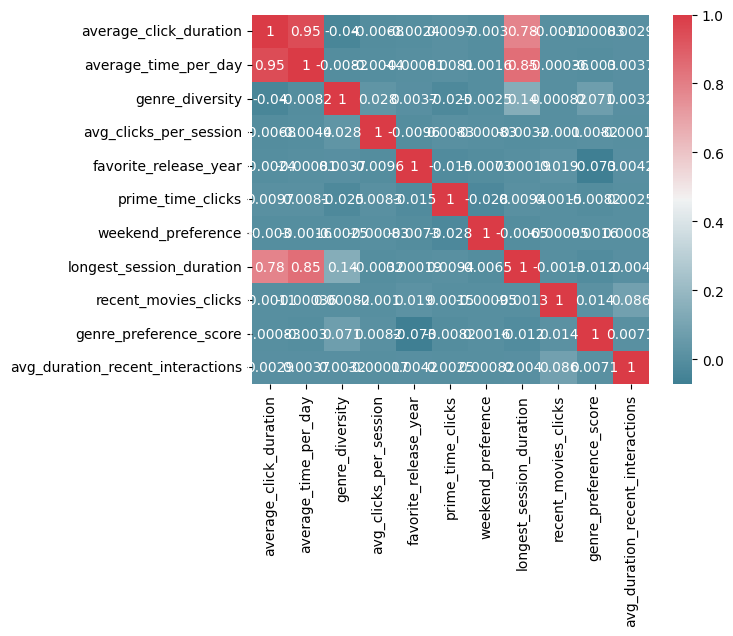

In [45]:
import seaborn as sns
corr = dataset_imputed[numerical_features].corr()
#we are building a heatmap for getting the pairwise correlation between the features:
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values,
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            annot=True)

It appears that average_click_duration, average_time_per_day, longest_session_duration are highly correlated. So keeping one of these variables, makes more sense and helps in dimensionality reduction. The variable which has lesser correlation with the target, shall be dropped in general. In my understabnding, average_click_duration and longest_session_duration can be dropped and only average_time_per_day can be kept which will essentially represent the previous two. Most other variables can be considered pairwise independent and hence, must be retained.

In [40]:
columns_to_drop=['average_click_duration','avg_clicks_per_session']

In [41]:
#dropping the numerical columns after checking the correlation heatmap and storing them as dataset_pca to do the pca on it in the further step:
dataset_pca=dataset_imputed.drop(columns=columns_to_drop)

In [42]:
#this will give us the categorical features list
dataset_pca.select_dtypes(['object','bool']).columns

Index(['user_id', 'favorite_genre', 'time_of_day', 'most_active_day',
       'old_movie_lover'],
      dtype='object')

In [43]:
#we don't process the user_id feature, because that is an index feature in our case
categorical_features = ['favorite_genre', 'time_of_day', 'most_active_day', 'old_movie_lover']

In [44]:
from sklearn.preprocessing import LabelEncoder
# Converting categorical variables to numerical using LabelEncoder
label_encoder = LabelEncoder()
dataset_pca[categorical_features] = dataset_pca[categorical_features].apply(label_encoder.fit_transform)

In [45]:
#Let's see how the Encoder has converted the Categorical features into numerical values
dataset_pca[categorical_features]

,favorite_genre,time_of_day,most_active_day,old_movie_lover
0,6,2,5,1
1,20,2,3,1
2,17,2,0,0
3,34,2,4,1
4,14,2,1,0
...,...,...,...,...
157910,5,2,6,0
157911,17,0,2,0
157912,29,2,6,1
157913,4,0,3,1


**Correlation Check**

Now we check for correlation among the encoded categorical features

<Axes: >

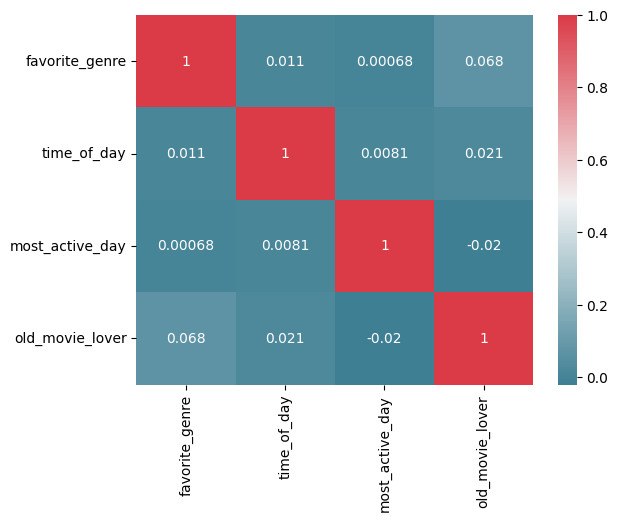

In [51]:
import seaborn as sns
corr2 = dataset_pca[categorical_features].corr()
#we are building a heatmap for getting the pairwise correlation between the features:
sns.heatmap(corr2, 
            xticklabels=corr2.columns.values,
            yticklabels=corr2.columns.values,
            cmap=sns.diverging_palette(220, 10, as_cmap=True),
            annot=True)

From this heatmap of the correlation of categorical variables, it can be concluded that these categorical variables are uncorrelated, implying that we have to keep these variables.

**Dimensionality Reduction**

**Principal Component Analysis**

Principal Component Analysis (PCA) is a commonly used method for dimensionality reduction, and it is applicable to continuous numerical features. It's particularly effective when dealing with high-dimensional data, aiming to capture the most significant variance in the dataset.

In [46]:
#to apply PCA to all the features now except the user_id feature, we exclude that one from the pca data
pca_data= dataset_pca.loc[:, dataset_pca.columns != 'user_id']

In [ ]:
# Standardize the data (important for PCA): PCA must be applied on features in the same scale
scaler = StandardScaler()
pca_data = scaler.fit_transform(pca_data)

In [48]:
# Applying PCA to the features
pca = PCA() #not specifying any number of components and applying to get the projection of all features
pca_components = pca.fit_transform(pca_data)

In [49]:
# Calculating the cumulative explained variance
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

# Determining the number of components to keep for 85% variance explained
n_components = np.argmax(cumulative_variance_ratio >= 0.85) + 1

In [50]:
n_components

9

9 Principal Components are enough to keep 85% of the variance.

In [29]:
# Explained variance (how important each additional principal component is)
pca = PCA().fit(pca_data)

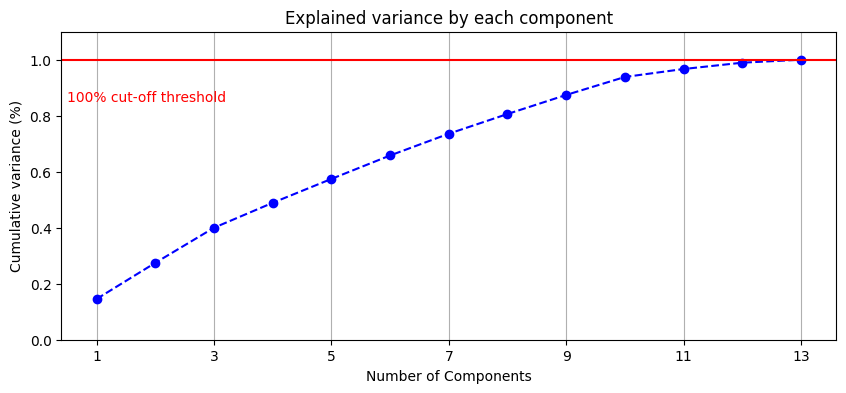

In [30]:
fig, ax = plt.subplots(figsize=(10,4))
xi = np.arange(1, 1+pca_data.shape[1], step=1)
yi = np.cumsum(pca.explained_variance_ratio_)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

# Aesthetics
plt.ylim(0.0,1.1)
plt.xlabel('Number of Components')
plt.xticks(np.arange(1, 1+pca_data.shape[1], step=2))
plt.ylabel('Cumulative variance (%)')
plt.title('Explained variance by each component')
plt.axhline(y=1, color='r', linestyle='-')
plt.text(0.5, 0.85, '100% cut-off threshold', color = 'red')
ax.grid(axis='x')

Now we use n_components=9 to transform the data using PCA to have 9 Principal Components, thereby we reduce the Dimensionality of the Data

In [51]:
pca = PCA(n_components=n_components)
data_reduced = pca.fit_transform(pca_data)

In [31]:
#After projecting the data with 9 Principal Components:
#here we get the total explained variance and visualise using plotly.express:
total_var = pca.explained_variance_ratio_.sum() * 100
fig2 = px.scatter_3d(
    data_reduced, x=0, y=1, z=2, size=0.1*np.ones(len(pca_data)), opacity = 1,
    title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
    width=800, height=500
)
fig2.show()

The number of features in the initial stage was 13 as shown below:

In [33]:
pca_data.shape[1]

13

After the dimensionality reduction technique applied, the reduced shape is 9. So there are 9 essential features in the PCA transformed dataset:

In [34]:
data_reduced.shape[1]

9

In [53]:
#converting the PCA reduced data to a pandas dataframe.
projected_data=pd.DataFrame(data_reduced)

In [54]:
#now visualizing the data
projected_data

,0,1,2,3,4,5,6,7,8
0,-0.002097,-1.361657,-1.282854,-0.255814,-1.608847,-0.141256,1.161137,0.113149,0.010561
1,0.750417,-1.955247,-0.524967,-1.275983,0.275745,0.515530,-2.619203,0.226524,0.843257
2,-0.781655,0.889989,-1.602464,-0.910076,0.475546,-0.043753,-0.109562,0.231257,-1.537892
3,0.487189,-2.703842,-1.124910,-2.298322,-1.635045,-0.120749,2.829278,-0.289368,-0.319844
4,-0.535786,1.008186,-0.898484,-0.659849,0.507539,-0.063016,-0.139712,0.184814,-0.772151
...,...,...,...,...,...,...,...,...,...
157910,-0.713452,0.346303,-1.483396,2.871095,-1.753474,0.046545,-0.069491,-0.389428,0.782721
157911,-1.050367,1.201548,1.860079,-0.300601,1.207160,-0.133356,0.407191,-0.179862,0.805098
157912,0.853679,-0.951107,-1.054896,-1.609322,-1.608598,0.551809,-1.591694,-0.025936,1.258605
157913,-0.248304,-0.941638,2.228925,0.735665,0.739146,-0.213964,0.728913,-0.160729,1.054643


In [56]:
#We want the User ID to still be the primary key for our projected data 
#Because it can be crucial in the clustering

projected_data.index = dataset_pca['user_id']

In [57]:
projected_data

,0,1,2,3,4,5,6,7,8
user_id,,,,,,,,,
00004e2862,-0.002097,-1.361657,-1.282854,-0.255814,-1.608847,-0.141256,1.161137,0.113149,0.010561
000052a0a0,0.750417,-1.955247,-0.524967,-1.275983,0.275745,0.515530,-2.619203,0.226524,0.843257
000090e7c8,-0.781655,0.889989,-1.602464,-0.910076,0.475546,-0.043753,-0.109562,0.231257,-1.537892
000118a755,0.487189,-2.703842,-1.124910,-2.298322,-1.635045,-0.120749,2.829278,-0.289368,-0.319844
000296842d,-0.535786,1.008186,-0.898484,-0.659849,0.507539,-0.063016,-0.139712,0.184814,-0.772151
...,...,...,...,...,...,...,...,...,...
fffd9bf758,-0.713452,0.346303,-1.483396,2.871095,-1.753474,0.046545,-0.069491,-0.389428,0.782721
fffe7b777b,-1.050367,1.201548,1.860079,-0.300601,1.207160,-0.133356,0.407191,-0.179862,0.805098
fffeac83be,0.853679,-0.951107,-1.054896,-1.609322,-1.608598,0.551809,-1.591694,-0.025936,1.258605


**Justifications of the choices:**

After checking the correlation of the numerical features, I dropped the highly correlated features and only kept the one which will meaningfully represent them.
Then I encoded the categorical features into numerical values, in order to understand their pairwise correlation and I found those features are uncorelated. So I kept all of them.
Then I ran the Principal Component Analysis on the transformed dataset. The PCA showed that all the principal components are explaining about 99.46% of the variance of the dataset. This means, I won't further reduce the dimensionality and now the dataset_pca is essentially containing the features I need to move forward with.

In [74]:
# We are saving our final projected dataset to keep track.
projected_data.to_csv('projected_data.csv')

**Cons of PCA**
1. The dataset loses its original meaning, it is not possible to understand the features in the projected data anymore.
2. PCA is better to apply only to Continuous Numerical Features, not for Categorical Features.
3. In order to do PCA, we had to encode Categorical features into numerical values, and often the choice of encoder is not easy.

## 2.3 Clustering!
Implement the K-means clustering algorithm (not ++: random initialization) using MapReduce. We ask you to write the algorithm from scratch following what you learned in class.

Find an optimal number of clusters. Use at least two different methods. If your algorithms provide diverse optimal K's, select one of them and explain why you chose it.

Run the algorithm on the data obtained from the dimensionality reduction.

Implement K-means++ from scratch and explain the differences with the results you got earlier.

Ask ChatGPT to recommend other clustering algorithms and choose one. Explain your choice, then ask ChatGPT to implement it or use already implemented versions (e.g., the one provided in the scikit-learn library) and run it on your data. Explain the differences (if there are any) in the results. Which one is the best, in your opinion, and why?

Distortion: It is calculated as the average of the squared distances from the cluster centers of the respective clusters to each data point. Typically, the Euclidean distance metric is used.

                Distortion = 1/n * Σ(distance(point, centroid)^2)

In [165]:
# MapReduce functions
def map_step(data, centroids):
    cluster_assignments = []
    for point in data:
        distances = [np.linalg.norm(point - centroid) for centroid in centroids]
        closest_centroid = np.argmin(distances)
        cluster_assignments.append((closest_centroid, point))
    return cluster_assignments

def reduce_step(cluster_assignments, k):
    cluster_assignments = np.array(cluster_assignments, dtype=object)
    new_centroids = [np.mean(cluster_assignments[cluster_assignments[:, 0] == i][:, 1], axis=0) for i in range(k)]
    return new_centroids

# K-means algorithm
def k_means_map_reduce(data, k, max_iterations=100):
    # Step 1: Initialize centroids randomly
    centroids = data[np.random.choice(len(data), k, replace=False)]

    for _ in range(max_iterations):
        # Step 2: Map
        cluster_assignments = map_step(data, centroids)

        # Step 3: Reduce
        new_centroids = reduce_step(cluster_assignments, k)

        # Check for convergence
        if np.all(np.array(new_centroids) == np.array(centroids)):
            break

        # Update centroids for the next iteration
        centroids = new_centroids

    return centroids
# Optimal K selection methods
def elbow_method(data, max_k=10):
    distortions = []
    for k in range(1, max_k + 1):
        centroids = k_means_map_reduce(data, k)
        distortion = sum(np.min(np.array([np.linalg.norm(point - centroid) for centroid in centroids])) for point in data)
        distortions.append(distortion)
    return distortions

In K-means clustering, elbow method and silhouette analysis or score techniques are used to find the optimal number of clusters in a dataset. The elbow method is used to find the “elbow” point, where adding additional data samples does not change cluster membership much. Silhouette score determines whether there are large gaps between each sample and all other samples within the same cluster or across different clusters.

**Elbow Method**

In [244]:
#we take the max k generally bit more than the total number of features in the projection, k>=n_components
max_k = 11
# applying our defined Elbow method to get the distortions
distortions = elbow_method(data_reduced, max_k)

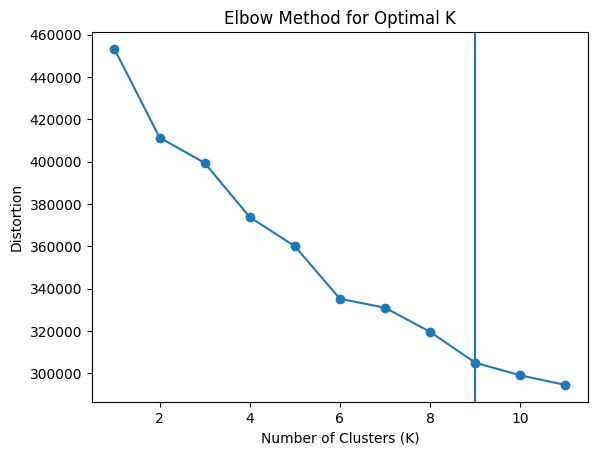

In [248]:
# Plotting the distortions
plt.plot(range(1, max_k + 1), distortions, marker='o')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.axvline(x = 9)
plt.ylabel('Distortion')
plt.show()

To determine the optimal number of clusters, we have to select the value of k at the “elbow” i.e. the point after which the distortion/inertia starts decreasing in a linear fashion.
But in practice, we often don't get a proper elbow. Sometimes, we use some intuition to pick a value for k. Here the distortion decreseas lesser after k=9, so we chose optimal k=9.

**Silhouette Score Method**

Silhouette Score is a metric to evaluate the performance of clustering algorithm. It uses compactness of individual clusters(intra cluster distance) and separation amongst clusters (inter cluster distance) to measure an overall representative score of how well our clustering algorithm has performed.
The silhouette score ranges from -1 to 1, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters. The highest silhouette score suggests a better-defined separation between clusters.

The Silhouette width 𝑠(𝑥𝑖) for the point 𝑥𝑖 is defined as:

$𝑠(𝑥𝑖)=𝑏(𝑥𝑖)−𝑎(𝑥𝑖)/max(𝑏(𝑥𝑖), 𝑎(𝑥𝑖))$

where 𝑥𝑖 is an element in cluster 𝜋𝑘, 𝑎(𝑥𝑖) is the average distance of 𝑥𝑖 to all other elements in the cluster 𝜋𝑘 (within dissimilarity), and

$𝑏(𝑥𝑖)=min (𝑑𝑙(𝑥𝑖))$, among all clusters 𝑙≠𝑘.

In [238]:
from sklearn.metrics import silhouette_score
def silhouette_score_method(data, max_k=10):
    silhouette_scores = []
    for k in range(2, max_k + 1):  # Silhouette score starts from K=2
        centroids = k_means_map_reduce(data, k)
        labels = np.argmin(np.array([np.linalg.norm(data - centroid, axis=1) for centroid in centroids]).T, axis=1)
        silhouette_scores.append(silhouette_score(data, labels))

    # Plot the silhouette scores
    plt.plot(range(2, max_k + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Score Method for Optimal K')
    plt.xlabel('Number of Clusters (K)')
    plt.ylabel('Silhouette Score')
    plt.show()

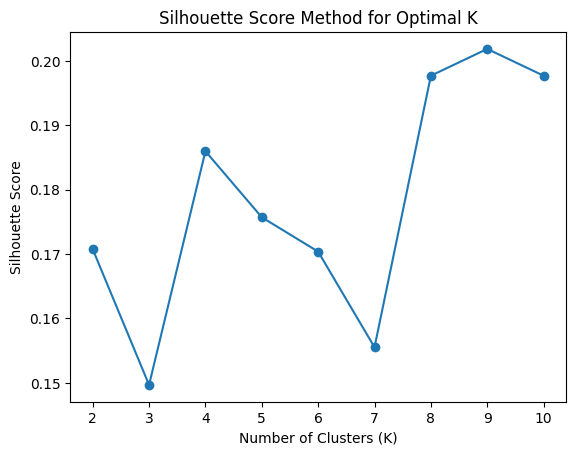

In [199]:
silhouette_score_method(data_reduced, max_k) #we took k=10, as already the elbow suggested us k=9, let's check the highest silhouette score within k=10.

Our choice of optimal K=9 based on the Silhouette Score method because we didn't really observe a perfect elbow in the elbow method, although, the decrease of inertia seemed to slowdown after k=9 in the elbow method. But both methods are surprisingly consistent with our choice.

**Justifications behind the Choice:**
The major difference between elbow and silhouette scores is that elbow only calculates the euclidean distance whereas silhouette takes into account variables such as variance, skewness, high-low differences, etc. The calculation simplicity of elbow makes it more suited than silhouette score for datasets with smaller size or time complexity. In the Elbow method where an SSE line plot is drawn, if the line chart looks like an arm, then the “elbow” on the arm is the value of k that is the best. It is the point, from where the decrease in SSE starts looking linear.

Silhouette analysis/scores and Silhouette plots look to have an edge over elbow method as one can evaluate clusters on multiple criteria such as the following and it is highly likely that one can end up determining the most optimal number of clusters in K-means. So we will go with the Silhouette Score Method.

In [59]:
optimal_k=9
final_centroids = k_means_map_reduce(data_reduced, optimal_k)
#Centroids are the centers of the clusters that the algorithm has identified.

Another application of PCA is in the visualisation of k-dimensional data in 3D or 2D space, let's see how we apply PCA to visualise the clusters:

In [208]:
# Visualize the results (using PCA for 2D visualization)
pca = PCA(n_components=2)
data_2d = pca.fit_transform(data_reduced)
final_centroids_2d = pca.transform(final_centroids)

In [60]:
cluster_assignments = map_step(data_reduced, final_centroids)

#The purpose of this function is to assign each data point in data_reduced to the nearest centroid.
# It calculates the distance between each data point and each centroid and assigns the data point 
# to the cluster represented by the closest centroid.

In [62]:
# Extracting cluster IDs and data points from the tuples obtained earlier
cluster_ids, clustered_data = zip(*cluster_assignments)

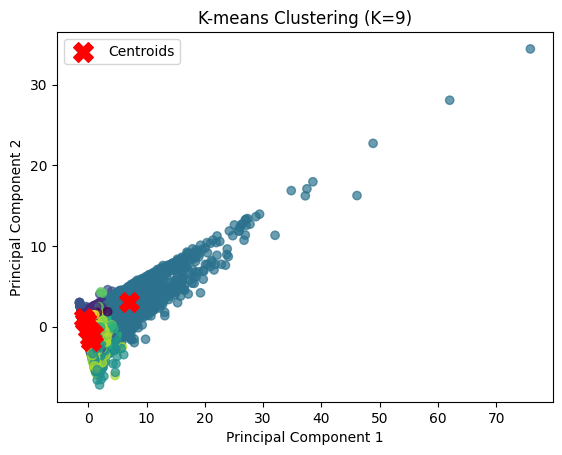

In [222]:
# Plot the clustered data
plt.scatter(data_2d[:, 0], data_2d[:, 1], c=cluster_ids, cmap='viridis', alpha=0.7)
plt.scatter(final_centroids_2d[:, 0], final_centroids_2d[:, 1], marker='X', s=200, c='red', label='Centroids')
plt.title(f'K-means Clustering (K={optimal_k})')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

The 2D space represents the clusters roughly, but does not really give a clearer picture, so we will also do the 3D visualisation by applying PCA

In [63]:
# Visualize the results (using PCA for 3D visualization)
pca_3d = PCA(n_components=3)
data_3d = pca_3d.fit_transform(data_reduced)
final_centroids_3d = pca_3d.transform(final_centroids)

##The purpose of this function is to assign each data point in data_reduced to the nearest centroid.
# It calculates the distance between each data point and each centroid and assigns the data point 
# to the cluster represented by the closest centroid.
# Convert the result of map_step to a NumPy array
cluster_assignments = map_step(data_reduced, final_centroids)

# Extract cluster IDs and data points
cluster_ids, clustered_data = zip(*cluster_assignments)

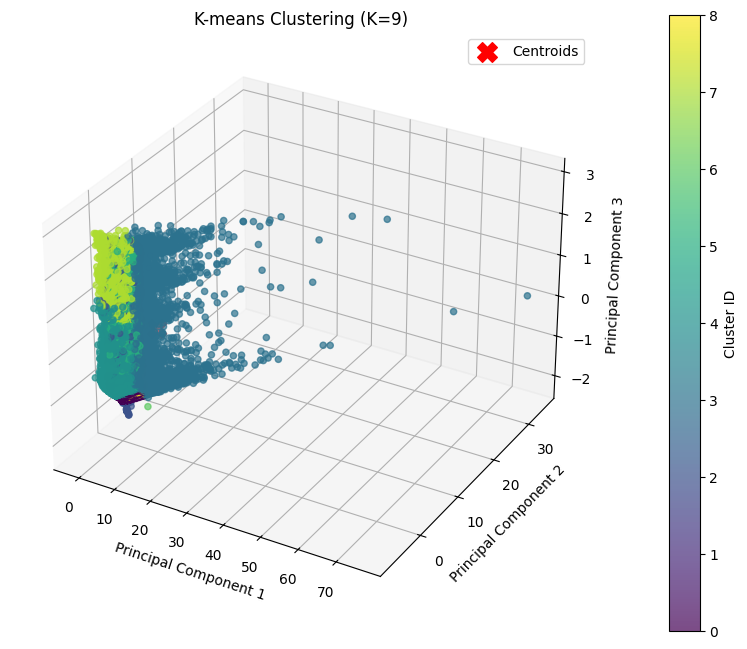

In [ ]:
# Plot the clustered data in 3D
fig1 = plt.figure(figsize=(10, 8))
ax = fig1.add_subplot(111, projection='3d')
scatter = ax.scatter(data_3d[:, 0], data_3d[:, 1], data_3d[:, 2], c=cluster_ids, cmap='viridis', alpha=0.7)
ax.scatter(final_centroids_3d[:, 0], final_centroids_3d[:, 1], final_centroids_3d[:, 2], marker='X', s=200, c='red', label='Centroids')
ax.set_title(f'K-means Clustering (K={optimal_k})')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.legend()

# Adding colorbar
colorbar = plt.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Cluster ID')

plt.show()

The above 3D plot shows a better picture.

In [ ]:
# Create a DataFrame for Plotly
df_kmeans = pd.DataFrame({'PC1': data_3d[:, 0], 'PC2': data_3d[:, 1], 'PC3': data_3d[:, 2], 'ClusterID': cluster_ids})

# Add centroids to the DataFrame
df_centroids = pd.DataFrame({'PC1': final_centroids_3d[:, 0], 'PC2': final_centroids_3d[:, 1], 'PC3': final_centroids_3d[:, 2], 'ClusterID': ['Centroid'] * optimal_k})

# Concatenate the DataFrames
df_combined = pd.concat([df_kmeans, df_centroids])

In [69]:
#we formed the dataframe after Kmeans in the above plot, we will set the index to the user_ids
df_kmeans.index= dataset_pca['user_id']

In [71]:
# We are saving our Clustered ID Dataframe for further Analysis in Question 2.4
df_kmeans.to_csv('df_kmeans.csv')

**K-means++**

K-means++ is an improvement over the classic K-means algorithm by providing a more intelligent initialization of the cluster centroids. Instead of randomly selecting initial centroids, K-means++ ensures a more spread-out initialization, which often leads to faster convergence and better final solutions.

In [33]:
def initialize_centroids_kmeans_pp(data, k):
    # Randomly choose the first centroid
    centroids = [data[np.random.choice(len(data))]]

    # Choose the next k-1 centroids using K-means++ initialization
    for _ in range(k - 1):
        distances = np.array([min([np.linalg.norm(point - c) for c in centroids]) for point in data])
        probabilities = distances / distances.sum()
        cumulative_probabilities = probabilities.cumsum()
        random_value = np.random.rand()
        new_centroid_index = np.searchsorted(cumulative_probabilities, random_value)
        centroids.append(data[new_centroid_index])

    return np.array(centroids)

def k_means(data, k, max_iterations=100):
    # Step 1: Initialize centroids using K-means++
    centroids = initialize_centroids_kmeans_pp(data, k)

    for _ in range(max_iterations):
        # Step 2: Assign each data point to the nearest centroid
        cluster_assignments = [np.argmin([np.linalg.norm(point - centroid) for centroid in centroids]) for point in data]

        # Step 3: Update centroids based on the mean of assigned data points
        new_centroids = [np.mean(data[np.array(cluster_assignments) == i], axis=0) for i in range(k)]

        # Check for convergence
        if np.all(np.array(new_centroids) == np.array(centroids)):
            break

        # Update centroids for the next iteration
        centroids = new_centroids

    return np.array(centroids), np.array(cluster_assignments)

In [34]:
max_k=9
# Applying K-means with K-means++ initialization
final_centroids_pp, cluster_assignments_pp = k_means(data_reduced, max_k)

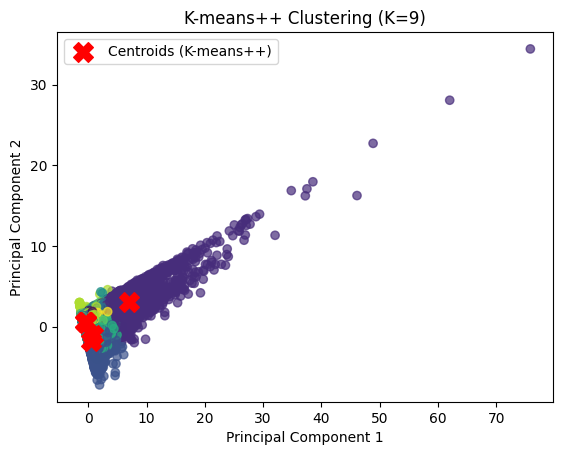

In [35]:
# Visualizing the results (using PCA for 2D visualization)
pca = PCA(n_components=2)
data_2d = pca.fit_transform(data_reduced)
final_centroids_pp_2d = pca.transform(final_centroids_pp)

plt.scatter(data_2d[:, 0], data_2d[:, 1], c=cluster_assignments_pp, cmap='viridis', alpha=0.7)
plt.scatter(final_centroids_pp_2d[:, 0], final_centroids_pp_2d[:, 1], marker='X', s=200, c='red', label='Centroids (K-means++)')
plt.title(f'K-means++ Clustering (K={max_k})')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

**K-Means Clustering Using Library Function**

To verify the manual implementation, I am also using the sklearn.cluster library function KMeans and showing the 3D plot for k=9 clusters.

In [ ]:
from sklearn.cluster import KMeans
# Assuming k is the number of clusters you specified
kmeans_pp_v2 = KMeans(n_clusters=9, init='k-means++')
cluster_labels_v2 = kmeans_pp_v2.fit_predict(data_reduced)

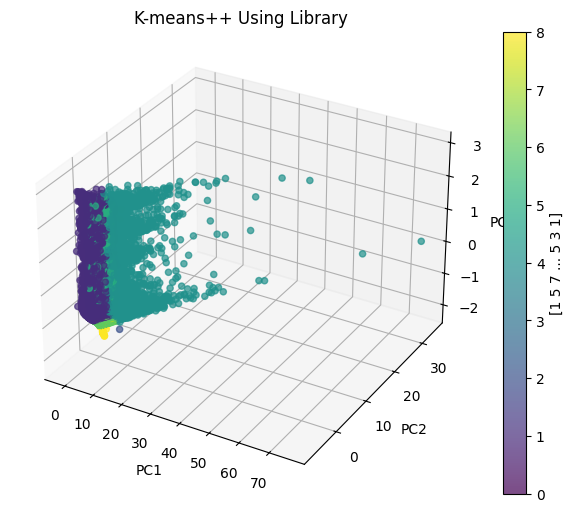

In [178]:
fig_lib = plt.figure(figsize=(8, 6))
ax = fig_lib.add_subplot(111, projection='3d')

scatter_lib = ax.scatter(data_reduced[:, 0], data_reduced[:, 1], data_reduced[:, 2], c=cluster_labels_v2, cmap='viridis', alpha=0.7)

# Add labels and title
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('K-means++ Using Library')

# Add color bar
fig_lib.colorbar(scatter_lib, ax=ax, label=cluster_labels_v2)

plt.show()

The above plot actually is equivalent to the plot obtained from the manual implementation, hence, it can be inferred, the manual implementation seems correct.

**Differences between K-means and K-means++:**

In case of Initialization: K-means++ initializes centroids more intelligently by spreading them out in a way that avoids the convergence issues associated with random initialization.

Increased Convergence Speed: K-means++ often converges faster than the classic K-means because the centroids are strategically placed, leading to a better starting point for the optimization process.

The main advantage lies in faster convergence and potentially more consistent results across multiple runs.

**Other Clustering Algorithms- Taken from Chat GPT**

There are various clustering algorithms beyond K-means, and the choice of algorithm often depends on the characteristics of your data and the specific requirements of your problem. Here are a few clustering algorithms that you might consider:

*Hierarchical Clustering:*

Description: Builds a tree of clusters, where each node represents a cluster containing its sub-clusters.
Pros: No need to specify the number of clusters beforehand. Captures hierarchical relationships in the data.
Cons: Computationally expensive for large datasets.

*DBSCAN (Density-Based Spatial Clustering of Applications with Noise):*

Description: Groups together data points that are close to each other and separates regions of lower point density.
Pros: Can find clusters of arbitrary shapes. Handles noise well.
Cons: Sensitive to parameter settings.

*Mean Shift:*

Description: Shifts centroids to areas of higher point density in the data space.
Pros: Does not require specifying the number of clusters. Handles irregular shapes well.
Cons: Sensitive to bandwidth parameter.

*Agglomerative Clustering:*

Description: Builds clusters iteratively by merging or agglomerating data points.
Pros: No need to specify the number of clusters beforehand. Provides a hierarchy of clusters.
Cons: Computationally expensive for large datasets.

*Gaussian Mixture Model (GMM):*

Description: Assumes that the data is generated from a mixture of several Gaussian distributions.
Pros: Flexible in capturing complex cluster shapes. Provides probabilistic cluster assignments.
Cons: Sensitive to initialization parameters.

**My choice and why-**
DBSCAN is particularly useful when dealing with datasets that have irregular shapes or varying densities. It can automatically identify outliers as noise and is less sensitive to the number of clusters.

It has Flexibility: DBSCAN can discover clusters of arbitrary shapes and is robust to noise.

We Don't Need Predefined Number of Clusters: DBSCAN does not require specifying the number of clusters in advance.

We can Handle Outliers: DBSCAN naturally identifies outliers as noise.

But, DBSCAN has parameters to tune, they often have more intuitive interpretations compared to some other algorithms.


**Applying DBSCAN using Library Function**

In [43]:
from sklearn.cluster import DBSCAN
# Apply DBSCAN
dbscan = DBSCAN(eps=1, min_samples=7)  
cluster_labels = dbscan.fit_predict(data_reduced)


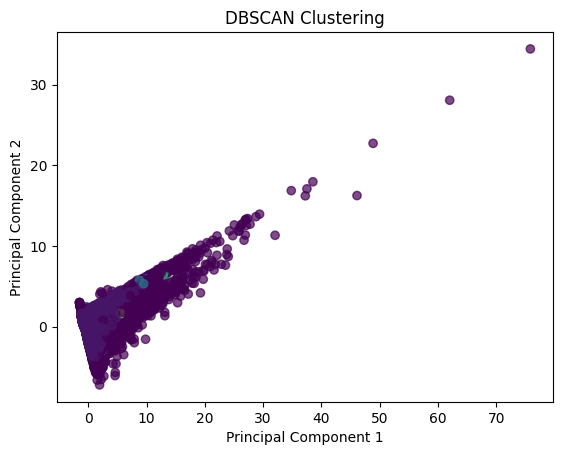

In [44]:
# Visualize the results
plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
plt.title('DBSCAN Clustering')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [49]:
num_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

print(f"Number of Clusters: {num_clusters}")

Number of Clusters: 18


**Observed Differences among the Results**

The number of clusters is more in DBSCAN than what we actually considered for K-Means. But also the intuitive assumptions for the parameters of DBSCAN affects the numbers. With eps=1, min_samples=7, the number of clusters is coming as 18. Min_samples means the minimum number of points in the neighbourhood, to be considered as a cluster. If we decrease the value for that parameter, the total number of clusters increased. But with an intuitively higher value such as min samples=9, the number of clusters are coming to be 12 according to DBSCAN. While we considered 9 clusters, in our K-means approach.

**Which one is the best, in your opinion, and why?**

KMeans and DBSCAN are two different algorithms with their own set of requirements. KMEANS require us to have an intuitive idea of the possible number of clusters, we assume a value, preferably, we calculate an optimal value using some heuristic technique and with that value of k, we apply K-means. This approach can often lead to certain results which is not really the case, but can be closer to it. The very assumption of k is dependent on the choices we make in the process and is therefore prone to errors when it comes to very large dataset. Whereas, DBSCAN is just the perfect fitting algorithm for a dataset, whose distribution is not properly known and the number of clusters is not a given. In my opinion, I will go for DBSCAN. But also, to keep in mind, no single algorithm can be declared the best. Because it depends on the nature and structure of the data and its behaviour; hence, it is a better idea to apply some algorithms on the data and compare the results and study the differences, how exactly the data is reacting in each of the scenarios. But, DBSCAN can be taken as a safer choice for our case because the data has varying densities and cluster shapes. Also, K Means is sensitive to the outliers and looking at the scatter plot of the PCA, we see there are outliers. In that case too, DBSCAN is a good choice, as outliers are labelled as noise and not considered in the cluster. But depends case to case basis, if outliers are important, then we can not just remove them and apply the algorithm, so we can keep them and apply. Therefore, DBSCAN has more points of advantage from that perspective. But DBSCAN is also sensitive to choices of the parameters: eps= neighbourhood radius and min_samples=minimum number of points in a neighborhood. The choices shall be made properly. eps and min_samples are chosen intuitively, looking at the scatter plots, for denser regions, eps can be selected smaller values, for sparser regions, eps shall be higher value and min_samples can be defined based on the minimum number of points expected in a dense region.

## 2.4 Analysing your results! --
You are often encouraged to explain the main characteristics that your clusters have. The latter is called the Characterizing Clusters step. Thus, follow the next steps to do it:

1. Select 2-3 variables you think are relevant to identify the cluster of the customer. For example, Time_Day, Average Click Duration, etc.

2. Most of your selected variables will be numerical (continuous or discrete), then categorize them into four categories.

3. With the selected variables, perform pivot tables. On the horizontal axis, you will have the clusters, and on the vertical axis, you will have the categories of each variable. Notice that you have to do one pivot table per variable.

4. Calculate the percentage by column for each pivot table. The sum of each row (cluster) must be 100. The sample example for clustering with K = 4 and Time_Day variable
5. Interpret the results for each pivot table.

6. Use any known metrics to estimate clustering algorithm performance (how good are the clusters you found?). Comment on the results obtained.

**Selecting the Numerical Variables**

I have chosen these three features: 1. average_time_per_day, 2. Time_Day, 3.average_click_duration 

In [129]:
#let's load our dataset
df=pd.read_csv('vodclickstream_uk_movies_03.csv', parse_dates=['datetime','release_date'])
del df['Unnamed: 0']
# Time of the day when the user spends the most time
df['Time_Day'] = df['datetime'].dt.hour

In [141]:
#let's load our feature-engineered dataset and see the numerical features first.
data_load= pd.read_csv('feature_engineered.csv', index_col=0)

In [74]:
#we also load the clustered dataset which has the clusterId assigned to user_id:
clustered_data=pd.read_csv("df_kmeans.csv")

In [142]:
#we merge the cluster IDs to the data with the features now:
data_load=pd.merge(data_load, clustered_data[['ClusterID','user_id']], on='user_id', how='left')

In [143]:
#this is the feature matrix along with the cluster labels
data_load

,user_id,favorite_genre,average_click_duration,time_of_day,average_time_per_day,genre_diversity,most_active_day,avg_clicks_per_session,favorite_release_year,prime_time_clicks,weekend_preference,longest_session_duration,recent_movies_clicks,genre_preference_score,avg_duration_recent_interactions,old_movie_lover,ClusterID
0,00004e2862,Drama,0.000000,Night,0.000,3,Tuesday,1.0,[2001],1.000000,0.000000,0.0,NaN,0,NaN,True,8
1,000052a0a0,Thriller,2024.166667,Night,4858.000,19,Sunday,1.0,[2012],0.750000,0.458333,7857.0,NaN,1,NaN,True,5
2,000090e7c8,Sci-Fi,0.000000,Night,0.000,3,Friday,1.0,[2018],1.000000,0.000000,0.0,NaN,2,NaN,False,6
3,000118a755,Horror,0.000000,Night,0.000,1,Thursday,1.0,[1976],1.000000,0.000000,0.0,NaN,3,NaN,True,1
4,000296842d,Mystery,9663.375000,Night,38653.500,4,Monday,1.0,[2018],0.625000,0.250000,62860.0,NaN,4,NaN,False,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157910,fffd9bf758,Crime,8495.000000,Night,8495.000,3,Wednesday,1.0,[2015],1.000000,0.000000,8495.0,NaN,597,NaN,False,8
157911,fffe7b777b,Sci-Fi,1785.000000,Afternoon,1785.000,3,Saturday,1.0,[2017],NaN,1.000000,1785.0,NaN,140,NaN,False,4
157912,fffeac83be,Documentary,40606.272727,Night,55833.625,12,Wednesday,1.0,[2015],0.909091,0.090909,173436.0,NaN,55,NaN,True,5
157913,ffff2c5f9e,Comedy,0.000000,Afternoon,0.000,5,Sunday,1.0,"[2007, 2013]",NaN,1.000000,0.0,NaN,212,NaN,True,4


**Characterizing Clusters**

In [145]:
data_load['Average_Time_Daily'] = pd.cut(data_load['average_time_per_day'],bins=[-1,5000,10000,30000,float('inf')],labels=['Below1.5H','1.5~3H','3~8H','Above8H'])
table = data_load.pivot_table(index='ClusterID',columns = 'Average_Time_Daily',aggfunc='count',fill_value=0)['average_time_per_day']
round(table.div(table.sum(axis=1), axis=0)*100,2)

Average_Time_Daily,Below1.5H,1.5~3H,3~8H,Above8H
ClusterID,,,,
0,0.00,0.00,0.00,100.00
1,50.97,8.47,11.95,28.62
2,50.54,9.91,13.32,26.23
3,60.01,9.76,6.78,23.45
4,55.83,9.98,11.75,22.44
5,16.28,8.48,27.53,47.71
6,55.58,8.04,8.65,27.73
7,56.47,9.92,11.06,22.55
8,59.98,9.39,6.87,23.76


**Interpretation 1:** After building the pivot table for the feature Average_Time_Daily (categorized version of average_time_per_day), we can see that
for each clusters, the cumulative percentage is 100%, let's pick for cluster 5: 16.28+8.48+27.53+47.71= 100%. For all the 9 clusters, each row sums to 100%. Also, it seems that for Cluster 0, there is the outlier.

In [146]:
#we merge the Time_Day feature from the OG dataset too
data_load=pd.merge(data_load, df[['Time_Day','user_id']], on='user_id', how='left')

In [148]:
data_load['Time_Day_Category'] = pd.cut(data_load['Time_Day'],bins=[6,12,18,24],labels=['Morning','Afternoon','Night'])
table = data_load.pivot_table(index='ClusterID',columns = 'Time_Day_Category',aggfunc='count',fill_value=0)['Time_Day']
round(table.div(table.sum(axis=1), axis=0)*100,2)

Time_Day_Category,Morning,Afternoon,Night
ClusterID,,,
0,13.19,33.60,53.21
1,13.95,29.46,56.59
2,24.60,52.76,22.64
3,3.72,17.95,78.32
4,26.19,56.45,17.36
5,15.53,33.46,51.02
6,4.72,17.58,77.70
7,28.74,55.64,15.62
8,3.27,17.77,78.96


**Interpretation 2:** After building the pivot table for the feature Time_Day_Category (categorized version of Time_Day), we can see that
for each clusters, the cumulative percentage is 100%, let's pick for cluster 7: 28.74+55.64+15.62= 100%. For all the 9 clusters, each row sums to 100%.

In [151]:
data_load['Click Average'] = pd.cut(data_load['average_click_duration'],bins=[-1,5000,10000,30000,float('inf')],labels=['Below1.5H','1.5~3H','3~8H','Above8H'])
table = data_load.pivot_table(index='ClusterID',columns = 'Click Average',aggfunc='count',fill_value=0)['average_click_duration']
round(table.div(table.sum(axis=1), axis=0)*100,2)

Click Average,Below1.5H,1.5~3H,3~8H,Above8H
ClusterID,,,,
0,0.00,0.00,0.00,100.00
1,46.06,8.63,20.60,24.71
2,46.62,9.83,20.39,23.16
3,56.82,7.79,14.75,20.64
4,52.50,10.42,15.84,21.24
5,21.03,16.77,37.01,25.19
6,48.88,7.39,17.61,26.13
7,52.33,10.71,16.86,20.10
8,53.29,7.47,16.80,22.43


**Interpretation 3:** After building the pivot table for the feature Click Average (categorized version of average_click_duration), we can see that
for each clusters, the cumulative percentage is 100%, let's pick for cluster 3: 56.82+7.79+14.75+20.64= 100%. For all the 9 clusters, each row sums to 100%.

**Metrics to Evaluate the Clustering Algorithm**

In [154]:
#This is our clustered dataframe for reference:
df_kmeans.head(3)

,PC1,PC2,PC3,ClusterID
user_id,,,,
00004e2862,-0.002097,-1.361657,-1.282854,8
000052a0a0,0.750417,-1.955247,-0.524967,5
000090e7c8,-0.781655,0.889989,-1.602464,6


In [ ]:
from sklearn.metrics import silhouette_score
data_for_evaluation = projected_data
cluster_labels = df_kmeans['ClusterID']

# Calculate Silhouette Score
silhouette_avg = silhouette_score(data_for_evaluation, cluster_labels)

In [164]:
print(f"Silhouette Score: {silhouette_avg}")

Silhouette Score: 0.19917728236281287


Interpretation of Silhouette Score:

The Silhouette Score ranges from -1 to 1.
A high Silhouette Score indicates well-separated clusters, where data points within the same cluster are close to each other, and clusters are far apart.
A low or negative score suggests overlapping or poorly separated clusters.
A Silhouette Score close to 1 would be indicative of good cluster separation.

Here, the score is 0.199 which is approximately 0.20.

A Silhouette Score of approximately 0.20 is a reasonable score. It suggests the clusters have a moderate level of separation and cohesion. The clustering has some level of structure, and points within the same cluster are more similar to each other than to points in other clusters.

In [168]:
from sklearn.metrics import calinski_harabasz_score

calinski_harabasz_value = calinski_harabasz_score(data_for_evaluation.values, cluster_labels)

In [169]:
print(f"Calinski-Harabasz Index: {calinski_harabasz_value}")

Calinski-Harabasz Index: 16062.71091548465


A Calinski-Harabasz Index of 16062.71 is a high value, indicating good clustering performance. The Calinski-Harabasz Index is a ratio of the between-cluster variance to the within-cluster variance, and higher values suggest well-defined and separate clusters.

In this case, a Calinski-Harabasz Index of 16062.71 indicates that the clusters formed by the K-means algorithm are distinct and have a high degree of separation compared to the within-cluster variance. This is a positive sign, suggesting that the algorithm has successfully identified meaningful and well-separated clusters in the data-set.

# [4. CLQ]

We have implemented the command line script leveraging the `sqlite3` command. In this way we were able to load the dataset into a temporary SQL database and to filter it using queries. 

Some notes on how we solved the three tasks:
1. __What is the most-watched Netflix title?__: in order to find the most watched film we used the `duration` column. We considered a film as seen if the value was $>0$, otherwhise the user simply clicked on that page without pushing the 'play' button. We have left, and commented, the code to find the Top-10 most watched films (un-comment it if you want to run it).
2. __Report the average time between subsequent clicks on Netflix.com__: we evaluated the average click duration among all the clicks, of all the users, in the dataset. We began with converting the `datetime` column into seconds (integer). Then we have built a new SQL table that has been filled with three new columns `datetime_int` (the `datetime` column converted to seconds), `previous_datetime_int` (the datetime of the previous click), and `difference` (their difference in seconds). Finally the result is the average of the `difference` column.
3. __Provide the ID of the user that has spent the most time on Netflix__: we have left, and commented, the code to find the Top-10 users by time spent (un-comment it if you want to run it).

Here you can find the [`CommandLine.sh`](CommandLine.sh) script, and below there is the screenshot with its output.

![CLQ Output](clq-output.png)

In [ ]:
#!/bin/bash

# Create a temporary database
sqlite3 netflix.db <<EOF
.mode csv
.import vodclickstream_uk_movies_03.csv clicks
EOF

## TOP-10 most watched films
# sqlite3 netlix.db 'SELECT title, COUNT(*) as num_views FROM clicks WHERE CAST(duration as INT) > 0 GROUP BY movie_id ORDER BY num_views DESC LIMIT 10'

## Most watched film
most_watched_film=$(sqlite3 netflix.db 'SELECT title FROM (SELECT title, COUNT(*) as num_views FROM clicks WHERE CAST(duration as INT) > 0 GROUP BY movie_id ORDER BY num_views DESC LIMIT 1)')
echo "The most watched film on Netlix is:   \"$most_watched_film\""

#------------------------------------------------------------

# Add a column 'datetime_int' to the table
sqlite3 netflix.db 'ALTER TABLE clicks ADD COLUMN datetime_int INT;'
# Convert datetime string to seconds and store it in the datetime_int column
sqlite3 netflix.db "UPDATE clicks SET datetime_int = CAST(strftime('%s', datetime) AS INT);"

# Create a new table (with only user_id and datetime_int) ordered by datetime_int in ascending order, since we want clicks to be subsequent
# We also create a column that contains the previous datetime_int, so that we can then evaluate easily the difference between subsequent clicks
sqlite3 netflix.db 'CREATE TABLE clicks_ordered AS SELECT user_id, datetime_int FROM clicks ORDER BY datetime_int ASC;' 
sqlite3 netflix.db 'ALTER TABLE clicks_ordered ADD COLUMN previous_datetime_int INT;'
sqlite3 netflix.db 'UPDATE clicks_ordered SET previous_datetime_int = datetime_int;' 
sqlite3 netflix.db 'UPDATE clicks_ordered SET previous_datetime_int = (SELECT datetime_int FROM clicks_ordered AS c WHERE c.rowid = clicks_ordered.rowid - 1);'

# Delete first row that has previous_datetime_int empty
sqlite3 netflix.db 'DELETE FROM clicks_ordered WHERE rowid = (SELECT MIN(rowid) FROM clicks_ordered);'

# Add a column to store the differences  
sqlite3 netflix.db 'ALTER TABLE clicks_ordered ADD COLUMN difference INT;' 
sqlite3 netflix.db 'UPDATE clicks_ordered SET difference = datetime_int - previous_datetime_int;'

# Evaluate the subsequent clicks average
average_time=$(sqlite3 netflix.db 'SELECT AVG(difference) FROM clicks_ordered')
echo "The average time between subsequent clicks on Netflix is:   $average_time s"



#------------------------------------------------------------

## TOP-10 users by time spent on Netlix
# sqlite3 netlix.db 'SELECT user_id, SUM(duration) as total_time FROM clicks GROUP BY user_id ORDER BY total_time DESC LIMIT 10'

# User-ID of the user that has spent the most time on Netflix
user_ID=$(sqlite3 netflix.db 'SELECT user_id FROM (SELECT user_id, SUM(duration) as total_time FROM clicks GROUP BY user_id ORDER BY total_time DESC LIMIT 1)')
echo "The ID of the user that has spent the most time on Netflix is:   $user_ID"

rm netflix.db

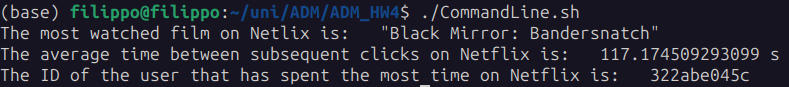

## [5. AQ]

#### Recursive Algorithm

We developed a first algotithm to solve the task. The idea behind it is to use the recursion in the following way:
-  we start with initial score $S$ and a vector of marks $p = [p_1, p_2, \dots, p_n]$
1. if $p$ has only one element then return it
2. otherwise for each element $p_i$ of $p$ repeat from 1. but considering as new score $S=p_i $, and also update the vector $p$ following the rules in the text of the exercise. Save every of this $n$ maximum score values in an array and return the maximum.

This algorithm causes a lot of memory usage and has an high complexity due to the high number of functions that are called in cascades. 
Below we report the algorithm:


In [2]:
def get_score_rec(S: int, p: list) -> int:
  
  # Store the length of the marks vector
  n = len(p)
  # Initializate an empty vector to store every possible maximum score
  # for every possible choice of the 'next' exam
  # It will be of length n
  values = []
  
  # Check if p has only one element
  # In that case the maximum score you can get is p[0]
  if n == 1:
    return p[0]
  else:
    
    # If p has more than one element then we cycle throughout all the possible
    # choices of the 'next' exam taken
    for i in range(n):
      
      # Store the 'next' exam taken as the new personal score
      S_tmp = p[i]
      
      # If he takes an 'easy' exam
      if S > p[i]:
        
        # Compute the difference between the score and the exam
        diff = S - p[i]
        
        # Remove from the list the exam and update all the other exams
        # In this case all the other exams become more difficult
        q = [p[j] + diff for j in range(n) if j != i]
        
      # In the case he takes an 'hard' exam
      elif S < p[i]:
        
        # Compute the difference between the exam and the score
        diff = p[i] - S
        
        # Remove from the list the exam and update all the other exams
        # In this case all the other exams become easier
        q = [p[j] - diff for j in range(n) if j != i]
        
      # If the exam has the same value as the personal score
      else:
        
        # Simply remove that exame from the vector 
        q = [p[j] for j in range(n) if j != i]
      
      # Then call recursively the function get_score_rec
      # passing as arguments the new score and the new vector
      # of length n - 1.
      # Store the maximum result, for that case, in the values array
      values.append(get_score_rec(S_tmp, q.copy()))
      
    # Now get the maximum element from all the possible n choices
    # of the 'next' exam and return it
    max_value = max(values)
    return max_value
  
# # Example of usage
# S = 25
# p = [18, 24, 21, 32, 27]
# 
# highest_score = get_score_rec(S, p)
# print(f'Highest mark: {highest_score}')     

This function has a very big time complexity. Before computing the worst case running time $T(n)$ we report here the code with annotated the running time of each operation.
```
def get_score_rec(S: int, p: list) -> int:
  
  n = len(p)                                            # O(1)
  values = []                                           # O(1)
  
  if n == 1:                                            # O(1)
    return p[0]                                         # O(1)
  else:
    for i in range(n):                                  # O(n)
      S_tmp = p[i]                                      # * O(1)
      if S > p[i]:                                      # * O(1)
        diff = S - p[i]                                 # * O(1)
        q = [p[j] + diff for j in range(n) if j != i]   # * O(n)
      elif S < p[i]:                                    # * O(1)
        diff = p[i] - S                                 # * O(1)
        q = [p[j] - diff for j in range(n) if j != i]   # * O(n)
      else:
        q = [p[j] for j in range(n) if j != i]          # * O(n)
      values.append(get_score_rec(S_tmp, q.copy()))     # * T(n-1)
    max_value = max(values)                             # O(n)
    return max_value                                    # O(1)  
```

Summing up all the comments about the running time, we see that $T(n)$ is recursively defined as
$\quad T(n) \sim
\begin{cases}
\mathcal{O}(1) & \text{ if }n = 1\\
\mathcal{O}(n^2) + n\ T(n-1) & \text{ if }n > 1\\ 
\end{cases}
$

It can be also written as follow:
$$ 
\begin{align*}
T(n) & \sim \mathcal{O}(n^2) + n\ T(n-1) \sim \mathcal{O}(n^2) + n\big(\mathcal{O}(n^2) + (n-1) T(n-2)\big)\sim \mathcal{O}(n^3) + n(n-1)T(n-2)\\
& \sim \mathcal{O}(n^3) + n(n-1)\big(\mathcal{O}(n^2) + n\ T(n-3)\big) \sim \mathcal{O}(n^4) + n(n-1)(n-2)T(n-3)\\
& \sim\dots\sim \mathcal{O}(n^{n+1}) + n!\ T(1)\sim \mathcal{O}(n^{n+1})
\end{align*}
$$
So $T(n)\sim \mathcal{O}(n^{n+1})$ and this algorithm has exponential running time.

#### Optimized Algorithm

Since $\mathcal{O}(n^{n+1})$ is a very high time complexity, we looked for an optimized algorithm to solve the problem. In particular we found that:
- consider the vector of all marks $p = [p_1, p_2, \dots, p_n]$ to be ordered such that $p_1\leq p_2\leq \dots\leq p_n$:
  - if $n$ is odd then the final mark does not depend on the initial score $S$ and is:  $\displaystyle\sum_{j=\frac{n-1}2+1}^{n}p_i - \sum_{i=1}^{\frac{n-1}2}p_j$
  - if $n$ is even then the final mark is:  $S + \displaystyle\sum_{j=\frac{n}2+1}^{n}p_i - \sum_{i=1}^{\frac{n}2}p_j$

It's simple to show that if $n$ is odd then the final mark does not depend on $S$. In fact Federico, the ficticious student, has to make $n-1$ choices for the exams (the last is dependent on those previous choices). Every $2$ choices $S$ is first added and then subtracted, so it disappears. But $n$ is odd, so $n-1$ is divisible by $2$ and that means that $S$ does not appear in the final score. 
We say that "Every $2$ choices $S$ is first added and then subtracted" because we can (WLOG) look at the following example where $n=3$:
- we have $S$ and $p = [p_1, p_2, p_3]$ 
- choose one of the three arbitrarily, WLOG $p_3$:
  - if $S \geq p_3$ then
    - $S^{(1)} = p_3$ and $p = [p_1 + S - p_3, p_2 + S - p_3]$ 
    
      then WLOG we pick $p_2 + S - p_3$
    - if $S^{(1)} \geq p_2 + S - p_3$ 

      then $S^{(2)} = p_2 + S - p_3$ and $p = [p_1 + S - p_3 + (S^{(1)} - (p_2 + S - p_3))] = [p_1 + S -p_3 +(p_3 - p_2 - S + p_3)] = [p_3 + p_1 - p_2]$ and the final score is $p_3 + p_1 - p_2$ and does not depend on $S$
    - if $S^{(1)} < p_2 + S - p_3$ 

      then $S^{(2)} = p_2 + S - p_3$ and $p = [p_1 + S - p_3 - ((p_2 + S - p_3) - S^{(1)})] = [p_1 + S -p_3 - (p_2 + S - p_3 - p_3)] = [p_3 + p_1 - p_2]$ and the final score is $p_3 + p_1 - p_2$ and does not depend on $S$
  - if $S < p_3$ then the final mark is the same, but we omit to write the calculus and all the subcases.

From this also follows that in the case of $n$ even then the initial personal score $S$ is summed to the final maximum score because here we have one more choice, that is equivalent to add $S$ to the final result computed considering $S^{(0)} = 0$ and $p = [p_1,p_2,\dots,p_n]$.


Now we prove our optimized algorithm using strong induction on the length $n$ of the vector of exams. 

If $n=1$ the vector of exams is $[p_1]$. Then the final score is $p_1$ and is the maximum obtainable.

If $n=2$ the vector of exams is $[p_1, p_2]$. Let us analyze all the possibilities:
- if Federico chooses $p_1$ as the first exam:
  - if $S > p_1$: final score = $p_2 + S - p_1$
  - if $S \leq p_1$: final score = $p_2 - p_1 + S$
- if Federico chooses $p_2$ as the first exam:
  - if $S > p_2$: final score = $p_1 + S - p_2$
  - if $S \leq p_2$: final score = $p_1 - p_2 + S$
  
So there are only two possibilities for the final score: $p_2-p_1 + S$ to $p_1 - p_2 + S$. Since $p_2 \geq p_1$ then the maximum final score will be $p_2-p_1 + S$ and follows the rules of our algorithm. 

By inductive hypothesis we have that the algorithm is right $\forall k<n$. Our discussion is divided into two cases, $n$ odd and $n$ even. 

If $n$ is odd we WLOG assume  that $S^{(0)} = 0$, because we have shown that the final score does not depend on the initial score. We want the last step (when we have only two exams left to choose from) to be to increase the final score, and to do this we must necessarily start by increasing all the exams by as much as possible. We want to increase them all, so Federico must choose as the first exam $p_n$ which has the largest value. By doing this we can increase the remaining exams, which become $p_i^{(1)}= p_i + p_n$ and $S^{(1)} =p_n$.
Again, we want to increase the exams values by as much value as possible. Since $S^{(1)} =p_n$ then Federico will have to choose $S^{(2)} =p_1^{(1)}$ since $p_n-p_1^{(1)}$ is the greatest possible difference between our exams. The remaining exams will then become $p_i^{(2)} = p_i^{(1)} + (p_n - p_1^{(1)}) = (p_i + p_n)+(p_n-p_1-p_n) = p_i + p_n - p_1$ and the score $S^{(2)} = p_n - p_1$. But now we can use the inductive hypothesis since we have a vector of votes of length less than $n$. So the final maximum score will be $$S^{(final)} = p_n - p_1 + p_{n-1}-p_2 + \dots + p_{\frac{n+3}2} - p_{\frac{n-1}2} + p_{\frac{n+1}2} = \displaystyle\sum_{j=\frac{n-1}2+1}^{n}p_i - \sum_{i=1}^{\frac{n-1}2}p_j$$

If $n$ is even the final score is the score we get considering $S^{(0)} = 0$, plus the original initial score. So we can assume $S^{(0)} = 0$. The treatment is analogous to that in the case of odd $n$ but starting this time by considering $p_1$, and concluding again with the inductive hypothesis.


Below is the implemented optimized algorithm. 

In [3]:
def get_score_optimized(S: int, p: list) -> int:
  
  # Store the length of the marks vector
  n = len(p)
  
  # Sort the vector of marks in ascending order
  p = sorted(p)
  
  # First summation:
  # If n is even, then the first summation is the sum of the first n/2 elements
  # If n is odd, then the first summation is the sum of the first (n-1)/2 elements
  jnk1 = sum([p[i] for i in range(0, n // 2)])
  
  # Second summation:
  # If n is even, then the second summation is the sum of the last n/2 elements
  # If n is odd, then the second summation is the sum of the last (n+1)/2 elements
  jnk2 = sum([p[i] for i in range(n // 2, n)]) 
  
  # Use the formulas explained in the report to compute the maximum score
  if n % 2 == 0:  
    return(S + jnk2 - jnk1)
    
  elif n % 2 == 1:
    return(jnk2 - jnk1)

Here we comment the code with the running time complexity of each operation.

```
def get_score_optimized(S: int, p: list) -> int:
  n = len(p)                                      # O(1)
  
  p = sorted(p)                                   # O(n*log(n))
  jnk1 = sum([p[i] for i in range(0, n // 2)])    # 
  jnk2 = sum([p[i] for i in range(n // 2, n)])    # O(n) (considering also the previous line) 
  
  if n % 2 == 0:                                  # O(1)
    return(S + jnk2 - jnk1)                       # O(1)
    
  elif n % 2 == 1:                                # O(1)
    return(jnk2 - jnk1)                           # O(1)
```
  
Summing up all the comments about the running time, we see can easily see that $T(n)$ is basically the cost of the sorting operation. If we consider, for example, merge-sort or quick-sort (that in practice is usually faster than merge-sort) we can say that $T(n)\sim \mathcal{O}(n\log n)$.  

In particular $T(n)\sim \Theta(n \log n)$ because every solution must order the values in the array, so our is an optimal solution. 

Finally, to show that both our algorithms works, we wrote a little script to test them of the sample inputs provided by the text of the exercise. Below you can see the results.

In [4]:
S = []
p = []

  
S.append(8)
p.append([5, 7, 1])

S.append(25)
p.append([18, 24, 21, 32, 27])


S.append(30)
p.append([13, 27, 41, 59, 28, 33, 39, 19, 52, 48, 55, 79])

for Score, exams in zip(S, p):
  print(f'Initial score: {Score}\nExams: {exams}')
  highest_score1 = get_score_rec(Score, exams)
  print(f'Recursive: {highest_score1}')  
  
  highest_score2 = get_score_optimized(Score, exams)
  print(f'Optimized: {highest_score2}')  
  print('-'*30)

Initial score: 8
Exams: [5, 7, 1]
Recursive: 11
Optimized: 11
------------------------------
Initial score: 25
Exams: [18, 24, 21, 32, 27]
Recursive: 44
Optimized: 44
------------------------------
Initial score: 30
Exams: [13, 27, 41, 59, 28, 33, 39, 19, 52, 48, 55, 79]
Recursive: 205
Optimized: 205
------------------------------


#### ChatGPT algorithm

We tried several times to query ChatGPT, and it was difficult to get it to cover the problem. Unfortunately, he only succeeded in giving us a suboptimal algorithm (which we report below) with running time complexity equal to $\mathcal{O}(n!\ n^2)$. 
ChatGPT was unable to provide a corrected algorithm with lower running time.

In [ ]:
## ChatGPT implementation

from itertools import permutations

def calculate_final_score(initial_score, marks):
    S = initial_score
    marks = list(marks)  # Convert tuple to a mutable list

    for i, mark in enumerate(marks):
        if mark < S:  # Easy exam
            for j in range(len(marks)):
                if j != i:
                    marks[j] += S - mark  # Adjust marks for easy exam
            S = mark  # Update Federico's score
        else:  # Hard exam
            for j in range(len(marks)):
                if j != i:
                    marks[j] -= mark - S  # Adjust marks for hard exam
            S = mark  # Update Federico's score

    return S

def find_maximum_final_score(initial_score, marks):
    max_final_score = initial_score
    max_permutation = marks

    # Generate all permutations of the exams
    all_permutations = permutations(marks)

    # Calculate final score for each permutation
    for permutation in all_permutations:
        final_score = calculate_final_score(initial_score, permutation)
        if final_score > max_final_score:
            max_final_score = final_score
            max_permutation = permutation

    return max_final_score, max_permutation

# Example usage
initial_score = 25
exam_marks = (18, 24, 21, 32, 27)

max_score, best_permutation = find_maximum_final_score(initial_score, exam_marks)
print("Maximum final score:", max_score)
print("Best permutation of exams:", best_permutation)


Maximum final score: 44
Best permutation of exams: (24, 18, 32, 21, 27)
